In [116]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as st
sns.set(color_codes=True)
from pylab import rcParams
rcParams['figure.figsize'] = 12, 7
import plotly.offline as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly import tools
from IPython.core.display import display, HTML
py.init_notebook_mode(connected=True)

In [118]:
data = pd.read_csv('data.csv', delimiter=';', parse_dates=['date'])
data = data.set_index(['date'])
data = data.sort_index()
data = data.drop(['dns1', 'dns2', 'dns3'])
data = data.dropna()

In [82]:
data.describe()

,OpenDNS,Google,Telstra
count,11127.000000,11127.000000,11127.000000
mean,97.664389,115.506838,24.669254
std,20.344249,27.846623,13.300590
min,18.930000,15.110000,14.580000
25%,87.050000,103.450000,19.710000
50%,96.330000,114.270000,22.540000
75%,105.685000,125.080000,25.740000
max,1190.290000,1416.480000,185.640000


In [52]:
dns_providers = ['OpenDNS', 'Google', 'Telstra']

In [145]:
response_time_plots = []
for dns_provider in dns_providers:
    response_times_plot = go.Scatter(x=data.index, y=data[dns_provider], name='{} provider response time'.format(dns_provider))
    layout = go.Layout(title='Response time timeline', width=1024, height=600)
    response_time_plots.append(response_times_plot)
    py.iplot(go.Figure(data=[response_times_plot], layout=layout))
py.iplot(go.Figure(data=response_time_plots, layout=layout))

In [138]:
py.iplot(ff.create_distplot([data[dns] for dns in dns_providers], dns_providers, bin_size=0.05))

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:20: VisibleDeprecationWarning:

using a non-integer number instead of an integer will result in an error in the future



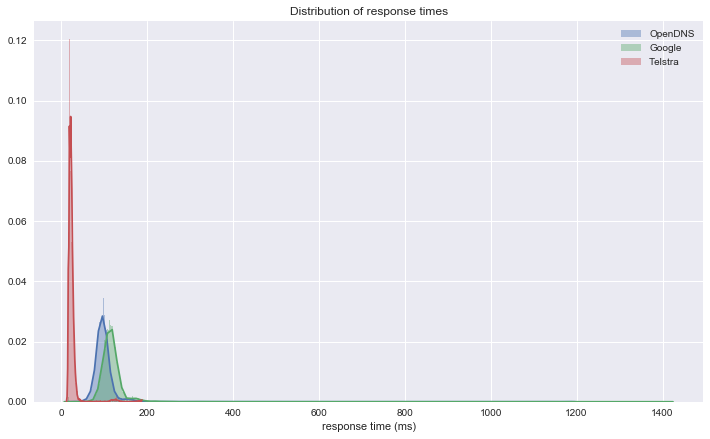

In [139]:
for dns in dns_providers:
    sns.distplot(data[dns], label=dns, axlabel='response time (ms)', bins=1000)
plt.title('Distribution of response times')
plt.legend()
plt.show()

In [103]:
for dns in dns_providers:
    display(HTML('<h2>{}</h2>'.format(dns)))
    percentiles = "\n".join(["<li>{} percentile is {}</li>".format(percentile*100, data[dns].quantile(q=percentile, interpolation='nearest')) for percentile in [0.5, 0.75, 0.8, 0.85, 0.9, 0.95, 0.99] ])
    display(HTML('<ul>{}</ul>'.format(percentiles)))
    conf_interval = st.norm.interval(0.95, loc=np.mean(data[dns]), scale=st.sem(data[dns]))
    print("95% confidence interval for {} is {} +- {}".format(dns, conf_interval[0], conf_interval[1]))
    display(HTML('<hr/>'))

95% confidence interval for OpenDNS is 97.2863815700532 +- 98.04239707648178


95% confidence interval for Google is 114.98943217268209 +- 116.02424446972006


95% confidence interval for Telstra is 24.422121521683625 +- 24.916386611685656


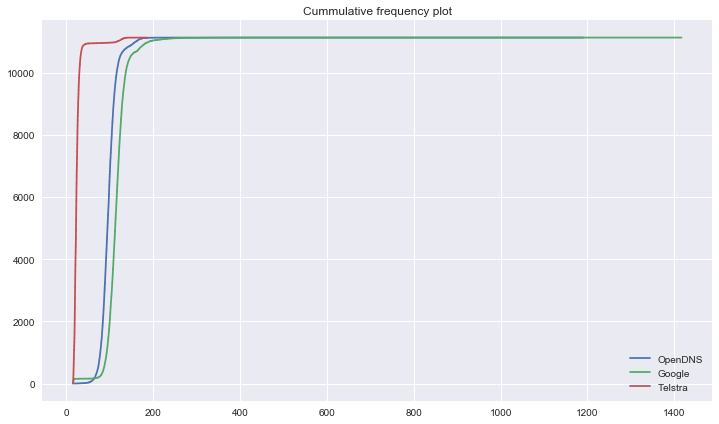

In [97]:
import numpy as np
import matplotlib.pyplot as plt

for dns in dns_providers:
    plt.step(np.sort(list(data[dns])), np.arange(len(data)), label=dns)
plt.legend()
plt.title('Cummulative frequency plot')
plt.show()

In [150]:
import scipy.stats as stats

for dns in dns_providers:
    display(HTML('<h2>{}</h2>'.format(dns)))
    print(stats.normaltest(data[dns]))

NormaltestResult(statistic=21665.511003434574, pvalue=0.0)


NormaltestResult(statistic=18232.16662897823, pvalue=0.0)


NormaltestResult(statistic=13116.968520181865, pvalue=0.0)
